`cd project/seniorthesis/notebooks`

`conda list PyCO2SYS`

`pip install PyCO2SYS`

`pip install git+https://github.com/jbusecke/cmip6_preprocessing.git`

In [1]:
import xarray as xr
from cmip6_preprocessing.preprocessing import combined_preprocessing
import PyCO2SYS as pyco2 # i have to install this package through terminal for it to work
import intake
import matplotlib.pyplot as plt
import numpy as np
import warnings
import gsw
from cmip6_preprocessing.postprocessing import combine_datasets
from cartopy import crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import cmocean
import matplotlib.path as mpath
from cmip6_preprocessing.postprocessing import combine_datasets
from cmip6_preprocessing.postprocessing import merge_variables

In [2]:
col = intake.open_esm_datastore("https://storage.googleapis.com/cmip6/pangeo-cmip6.json")

#### Here are all my functions

In [3]:
def draw_SOcustom(X,Y,Z,cmap,cbar_label,title,plot_type,**kwargs):
    
    crs_plot = ccrs.SouthPolarStereo()
    crs_source = ccrs.PlateCarree()
    
    fig,ax = plt.subplots(figsize=(10,10),subplot_kw={'projection':crs_plot})
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    ax.set_title(title,fontsize=14,pad = 20)
    
    if plot_type == 'contourf':
        im = ax.contourf(X,Y,Z,kwargs['clevs'],cmap=cmap,transform=crs_source)
    elif plot_type == 'pcolormesh':
        im = ax.pcolormesh(X,Y,Z,cmap=cmap,transform=crs_source,vmin=kwargs['clims'][0],vmax=kwargs['clims'][1])
    
    cbar = plt.colorbar(im,orientation='horizontal',fraction=0.025,pad=0.05)
    cbar.set_label(cbar_label,fontsize=12)
    
#     plt.show()
    
    return fig,ax

def pick_first_member(ds_list, **kwargs):
    return ds_list[0]

def calc_PpCO2(ds):
    p = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)
    insitutemp = gsw.t_from_CT(ds['so'], ds['thetao'], p)  # 0 is just a filler rn 
    results = pyco2.sys(par1=ds['talk']*1035.0,par2=ds['dissic']*1035.0,par1_type=1,par2_type=2,
                        pressure_out=0, temperature_out = ds['thetao'], pressure = p, 
                        temperature = insitutemp)
    return ds['talk'].copy(data=results['pCO2_out'])

def meridionalsection(ax,da,clims=None,title=None):
    im = ax.pcolormesh(da['y'],da['lev'],da)
    if clims is not None:
        im.set_clim(clims)
    ax.set_xlim([-80,60])
    ax.invert_yaxis()
    plt.colorbar(im,ax=ax)
    ax.set_title(title)
    
def calc_sigma2(ds):
    return gsw.sigma2(ds['so'],ds['thetao'])

def meridionalsection_with_sigma2(ax,da,sigma2,clims=None,title=None):
    meridionalsection(ax,da,clims)
    ax.contour(da['y'],da['lev'],sigma2,levels=[36,36.4,36.8],colors='w')
    ax.set_title(title)

### `dissic`, `talk`, `so`, and `thetao`

In [4]:
variables = ['dissic','talk', 'so', 'thetao']
z_kwargs = {'consolidated': True, 'use_cftime': True}
query = dict(experiment_id=['historical'], 
             table_id=['Omon'], 
             variable_id=variables,
             grid_label=['gr'],
              source_id=['GFDL-ESM4', 'CESM2-WACCM', 'CESM2', 
                         'CESM2-FV2', 'NorESM2-LM', 'MRI-ESM2-0', 
                         'GFDL-CM4', 'CESM2-WACCM-FV2']
            )


cat = col.search(**query)

# print(cat.df['source_id'].unique())
dset_dict_old = cat.to_dataset_dict(zarr_kwargs=z_kwargs, storage_options={'token': 'anon'},
                                preprocess=combined_preprocessing, aggregate=False)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


### Merge variables for `dissic`, `talk`, `so`, and `thetao`

In [5]:
dd_new = merge_variables(dset_dict_old)
list(dd_new.keys())

/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:122: UserWarning: CMIP.NCAR.CESM2-FV2.historical.r3i1p1f1.Omon.gr.none failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:122: UserWarning: CMIP.NCAR.CESM2-WACCM-FV2.historical.r2i1p1f1.Omon.gr.none failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:122: UserWarning: CMIP.NCAR.CESM2-FV2.historical.r2i1p1f1.Omon.gr.none failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.

['MRI-ESM2-0.gr.historical.Omon.r2i1p1f1',
 'CESM2.gr.historical.Omon.r7i1p1f1',
 'MRI-ESM2-0.gr.historical.Omon.r3i1p1f1',
 'CESM2.gr.historical.Omon.r3i1p1f1',
 'CESM2.gr.historical.Omon.r5i1p1f1',
 'MRI-ESM2-0.gr.historical.Omon.r1i2p1f1',
 'CESM2-WACCM.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r2i1p1f1',
 'NorESM2-LM.gr.historical.Omon.r2i1p1f1',
 'CESM2-WACCM.gr.historical.Omon.r3i1p1f1',
 'GFDL-CM4.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r11i1p1f1',
 'NorESM2-LM.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r6i1p1f1',
 'CESM2.gr.historical.Omon.r4i1p1f1',
 'CESM2-WACCM-FV2.gr.historical.Omon.r1i1p1f1',
 'MRI-ESM2-0.gr.historical.Omon.r4i1p1f1',
 'CESM2-WACCM.gr.historical.Omon.r2i1p1f1',
 'CESM2.gr.historical.Omon.r9i1p1f1',
 'CESM2-FV2.gr.historical.Omon.r1i1p1f1',
 'NorESM2-LM.gr.historical.Omon.r3i1p1f1',
 'MRI-ESM2-0.gr.historical.Omon.r1i1p1f1',
 'GFDL-ESM4.gr.historical.Omon.r1i1p1f1',
 'CESM2.

### Filter for models with all vars: `dissic`, `talk`, `so`, and `thetao`

In [6]:
dd_has_all_vars={}
for name,item in dd_new.items():
    #print(name)
    #print(item.data_vars)
    present = item.data_vars
    if all(i in present for i in variables):
        #print(name)
        dd_has_all_vars[name]=item
list(dd_has_all_vars.keys())

['CESM2.gr.historical.Omon.r7i1p1f1',
 'CESM2.gr.historical.Omon.r3i1p1f1',
 'CESM2.gr.historical.Omon.r5i1p1f1',
 'MRI-ESM2-0.gr.historical.Omon.r1i2p1f1',
 'CESM2-WACCM.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r2i1p1f1',
 'CESM2-WACCM.gr.historical.Omon.r3i1p1f1',
 'GFDL-CM4.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r11i1p1f1',
 'NorESM2-LM.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r6i1p1f1',
 'CESM2.gr.historical.Omon.r4i1p1f1',
 'CESM2-WACCM-FV2.gr.historical.Omon.r1i1p1f1',
 'CESM2-WACCM.gr.historical.Omon.r2i1p1f1',
 'CESM2.gr.historical.Omon.r9i1p1f1',
 'CESM2-FV2.gr.historical.Omon.r1i1p1f1',
 'GFDL-ESM4.gr.historical.Omon.r1i1p1f1',
 'CESM2.gr.historical.Omon.r8i1p1f1']

### Combine datasets and pick first member

In [7]:
dd_new_new = combine_datasets(
    dd_has_all_vars,
    pick_first_member,
    match_attrs=['source_id', 'grid_label', 'experiment_id', 'table_id']
)
list(dd_new_new.keys())

['CESM2.gr.historical.Omon',
 'MRI-ESM2-0.gr.historical.Omon',
 'CESM2-WACCM.gr.historical.Omon',
 'GFDL-CM4.gr.historical.Omon',
 'NorESM2-LM.gr.historical.Omon',
 'CESM2-WACCM-FV2.gr.historical.Omon',
 'CESM2-FV2.gr.historical.Omon',
 'GFDL-ESM4.gr.historical.Omon']

In [ ]:
dd_new_new

In [ ]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_pco2 in dd_new_new.items():
    ax = axarr_pco2.flat[ax_idx]
    ds_pco2 = ds_pco2.isel(time=1200).sel(x=slice(180,200)).mean('x',keep_attrs=True)
    pco2 = calc_PpCO2(ds_pco2)
    sigma2 = calc_sigma2(ds_pco2)
    meridionalsection_with_sigma2(ax,pco2,sigma2, clims=[500,2000],title=ds_pco2.attrs['intake_esm_dataset_key'])

### `dd_so`, `dd_DIC`, `dd_talk`, `dd_thetao`

In [8]:
dd_so={}
dd_DIC={}
dd_talk={}
dd_thetao={}

for name,item in dd_new_new.items():
    #print(name)
    #print(item.data_vars)
    #present = item.data_vars
    SO = 'so'
    THETAO = 'thetao'
    TALK = 'talk'
    DIC = 'dissic'
    FGCO2 = 'fgco2'
    #if all(i in present for i in variables):
        #print(name)
        #temp[name]=dset_dict[name]
    if SO in item:
        dd_so[name] = item
    if DIC in item:
        dd_DIC[name] = item
    if TALK in item:
        dd_talk[name] = item
    if THETAO in item:
        dd_thetao[name] = item


## Trying to fic NorESM2-LM

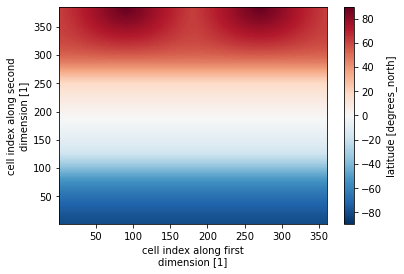

In [43]:
dd_so['NorESM2-LM.gr.historical.Omon'].lat.plot()

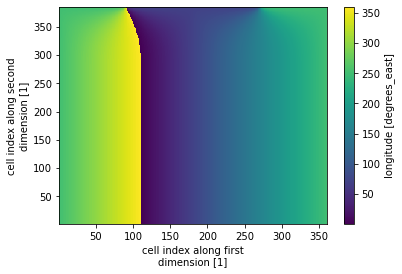

In [44]:
dd_so['NorESM2-LM.gr.historical.Omon'].lon.plot()

In [46]:
dd_so['NorESM2-LM.gr.historical.Omon'].lon

<xarray.DataArray 'lon' (y: 385, x: 360)>
dask.array<copy, shape=(385, 360), dtype=float64, chunksize=(385, 360), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) int32 1 2 3 4 5 6 7 8 9 ... 352 353 354 355 356 357 358 359 360
  * y        (y) int32 1 2 3 4 5 6 7 8 9 ... 377 378 379 380 381 382 383 384 385
    lat      (y, x) float64 dask.array<chunksize=(385, 360), meta=np.ndarray>
    lon      (y, x) float64 dask.array<chunksize=(385, 360), meta=np.ndarray>
Attributes:
    bounds:         vertices_longitude
    long_name:      longitude
    standard_name:  longitude
    units:          degrees_east

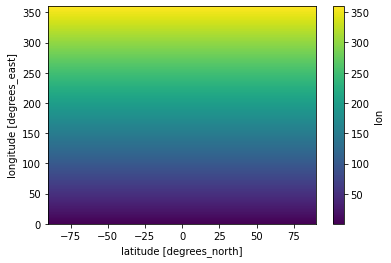

In [45]:
dd_so['CESM2-WACCM-FV2.gr.historical.Omon'].lon.plot()

### fgCO2

In [13]:

z_kwargs = {'consolidated': True, 'use_cftime': True}
query_2 = dict(experiment_id=['historical'], 
             table_id=['Omon'], 
             variable_id='fgco2',
             grid_label=['gr'],
              source_id=['GFDL-ESM4', 'CESM2-WACCM', 'CESM2', 
                         'CESM2-FV2', 'NorESM2-LM', 'MRI-ESM2-0', 
                         'GFDL-CM4', 'CESM2-WACCM-FV2']
            )


cat_2 = col.search(**query_2)

# print(cat.df['source_id'].unique())
dd_fgco2_old = cat_2.to_dataset_dict(zarr_kwargs=z_kwargs, storage_options={'token': 'anon'},
                                preprocess=combined_preprocessing, aggregate=False)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [18]:
dd_fgco2 = combine_datasets(
    dd_fgco2_old,
    pick_first_member,
    match_attrs=['source_id', 'grid_label', 'experiment_id', 'table_id']
)
list(dd_fgco2.keys())

['GFDL-ESM4.gr.historical.Omon',
 'CESM2-WACCM.gr.historical.Omon',
 'CESM2.gr.historical.Omon',
 'CESM2-FV2.gr.historical.Omon',
 'GFDL-CM4.gr.historical.Omon',
 'CESM2-WACCM-FV2.gr.historical.Omon',
 'MRI-ESM2-0.gr.historical.Omon']

## Surface

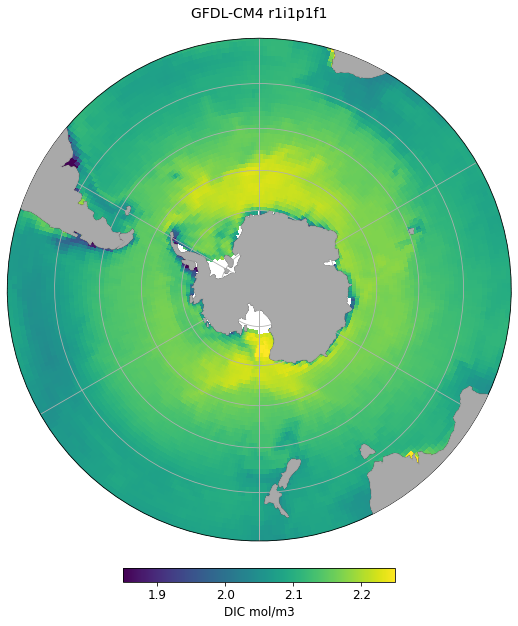

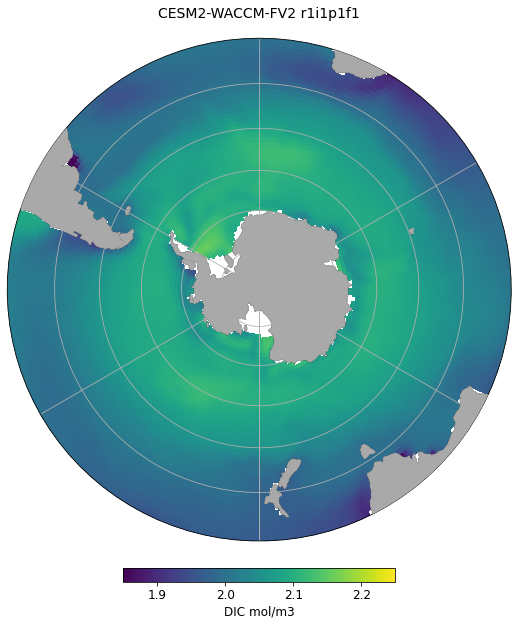

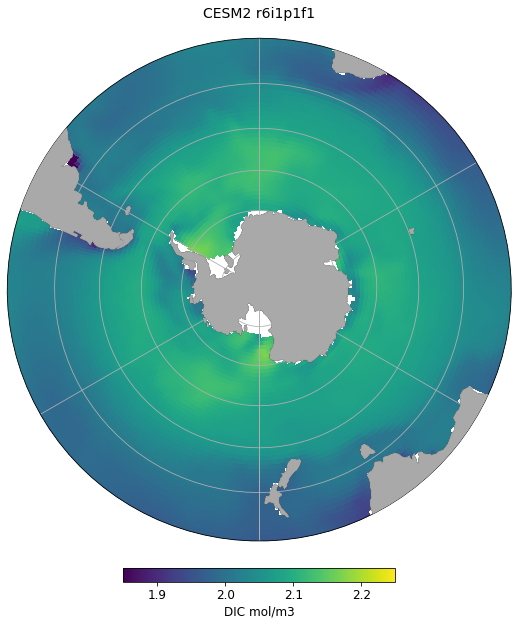

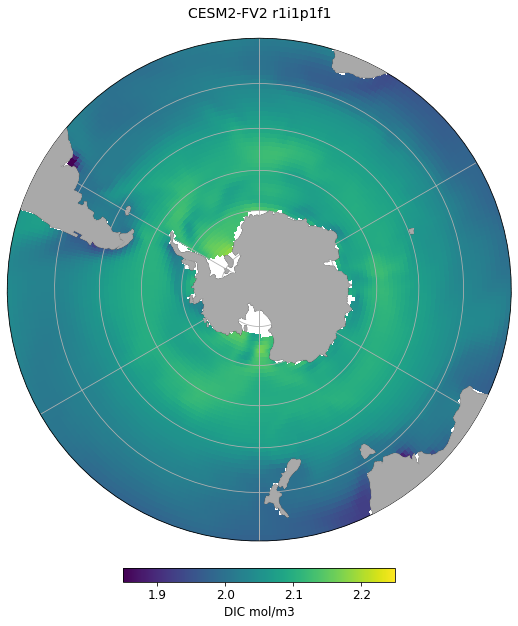

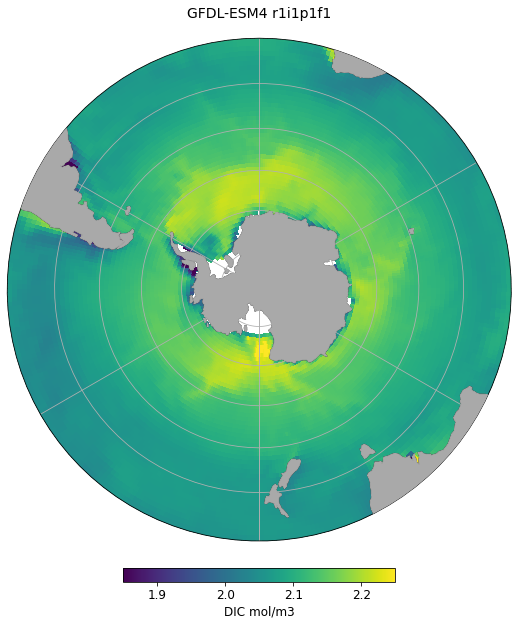

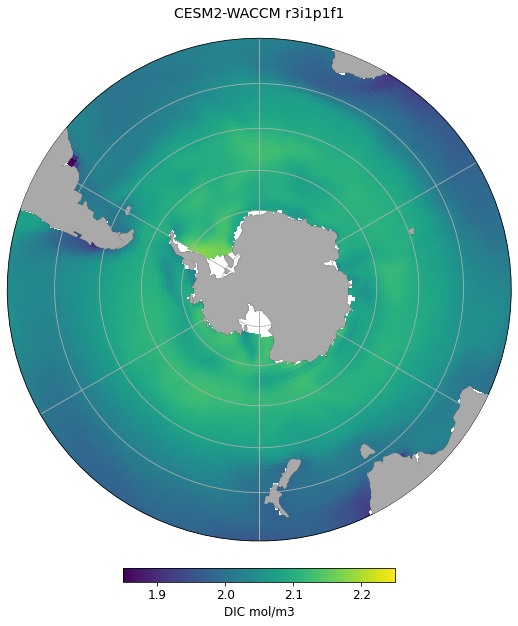

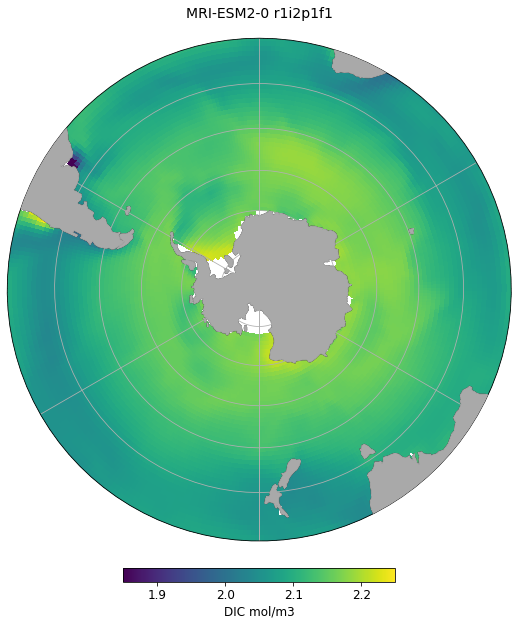

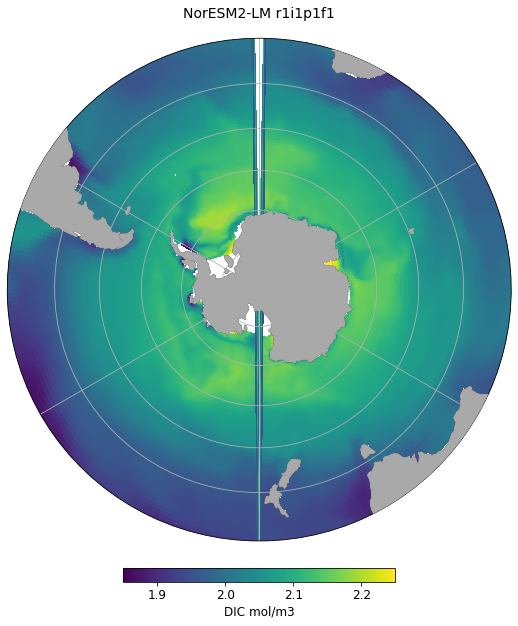

In [15]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_DIC in dd_DIC.items():
    #ax = axarr_DIC.flat[ax_idx]
    if 'member_id' in ds_DIC.dims:
        ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_DIC.dissic.isel(lev = 0, time = 1)
#     print(surf)
    lat = ds_DIC.lat.transpose('y','x')
#     print(lat)
    lon = ds_DIC.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='viridis',cbar_label='DIC mol/m3',title=ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'],plot_type='pcolormesh',clims=[1.85,2.25])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
#     ax.set_title(ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'])
#     ax.set_xlabel('Latitude')
#     ax.set_ylabel('Depth (m)')
#     ax.set_ylim([6000, 0])
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

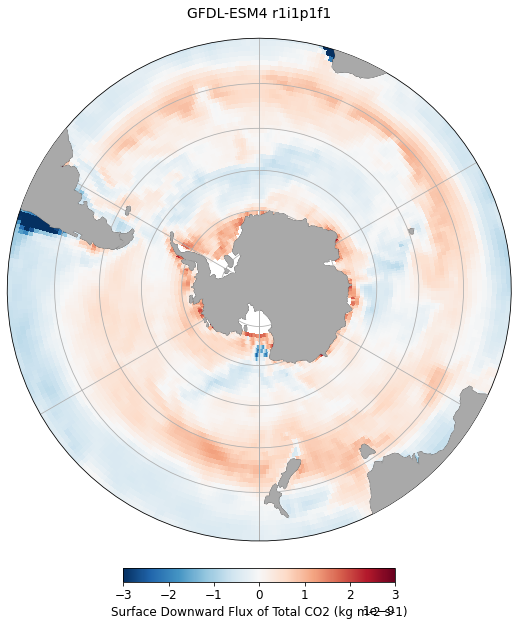

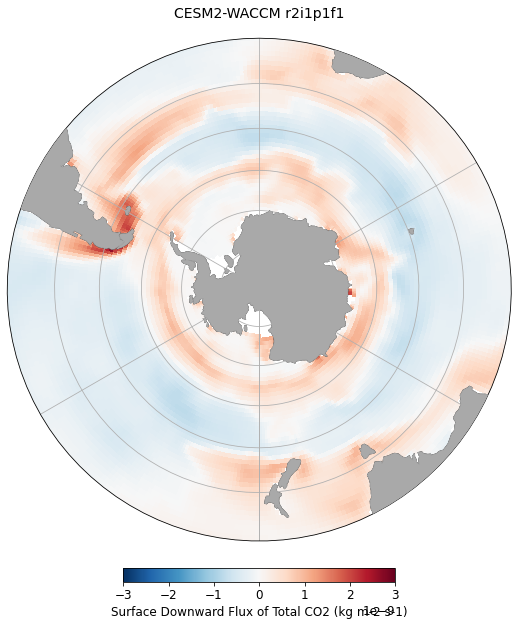

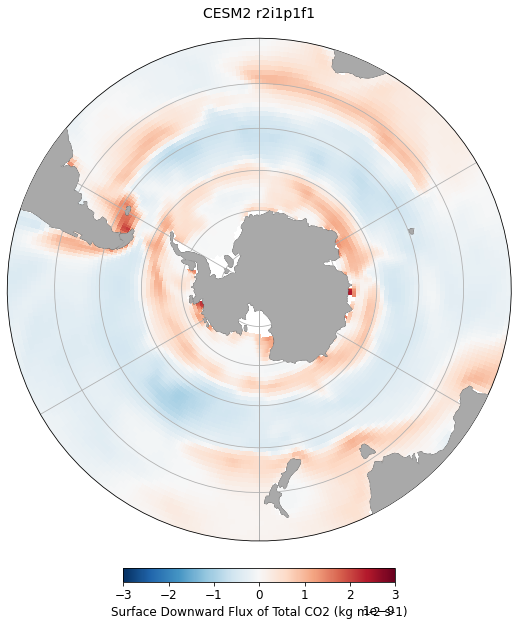

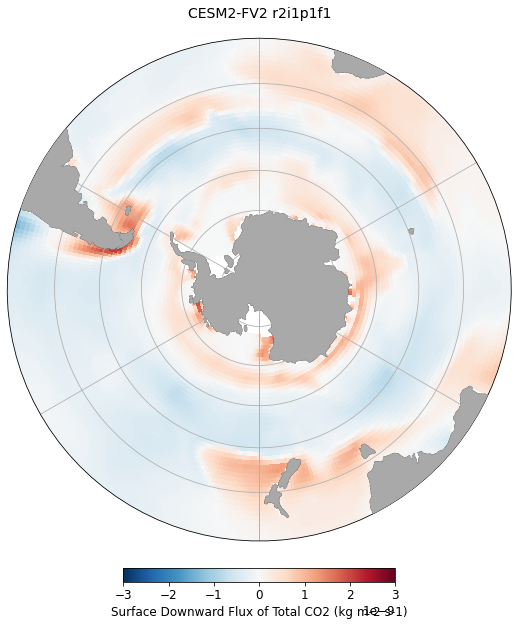

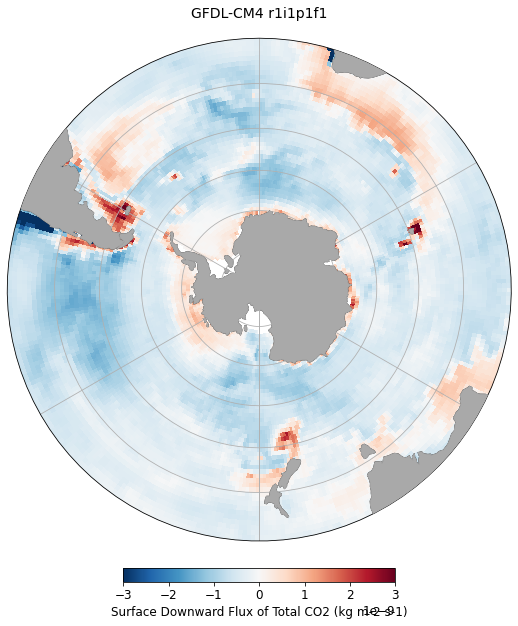

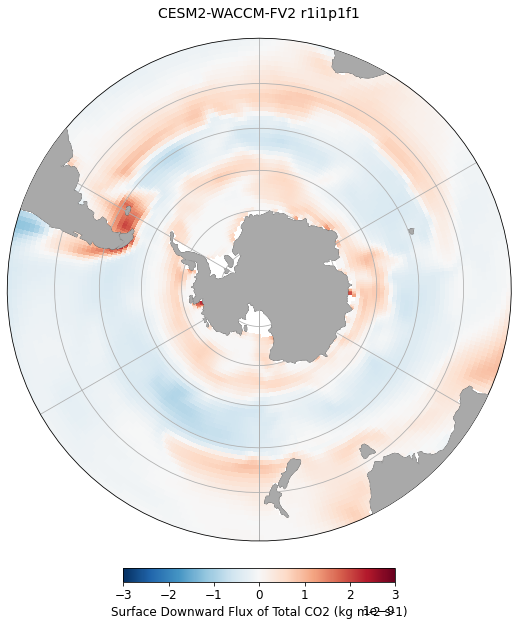

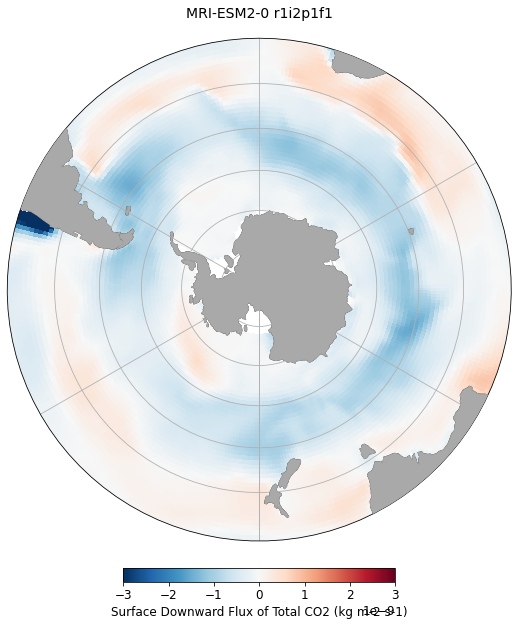

In [20]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

ax_idx = 0 # index for your axes array
for name, ds_fgco2 in dd_fgco2.items():
    #ax = axarr_DIC.flat[ax_idx]
#     if 'member_id' in ds_fgco2.dims:
#         ds_fgco2 = ds_fgco2.isel(member_id=0)
    surf = ds_fgco2.fgco2.isel(time = 0)
#     print(surf)
    lat = ds_fgco2.lat.transpose('y','x')
#     print(lat)
    lon = ds_fgco2.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='RdBu_r',cbar_label='Surface Downward Flux of Total CO2 (kg m-2 s-1)',title=ds_fgco2.attrs['source_id']+ ' '+ds_fgco2.attrs['variant_label'],plot_type='pcolormesh',clims=[-3e-9,3e-9])
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

(array([2.430000e+02, 0.000000e+00, 0.000000e+00, 9.390000e+02,
        9.990000e+02, 4.962000e+03, 1.037769e+06, 7.467100e+04,
        4.623000e+03, 3.800000e+01]),
 array([ 6.9023986, 10.980112 , 15.057825 , 19.135538 , 23.213251 ,
        27.290964 , 31.36868  , 35.446392 , 39.524105 , 43.601818 ,
        47.67953  ], dtype=float32),
 <BarContainer object of 10 artists>)

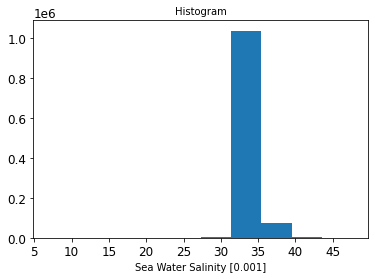

In [23]:
dd_so['CESM2-FV2.gr.historical.Omon'].so.isel(time=0).plot()

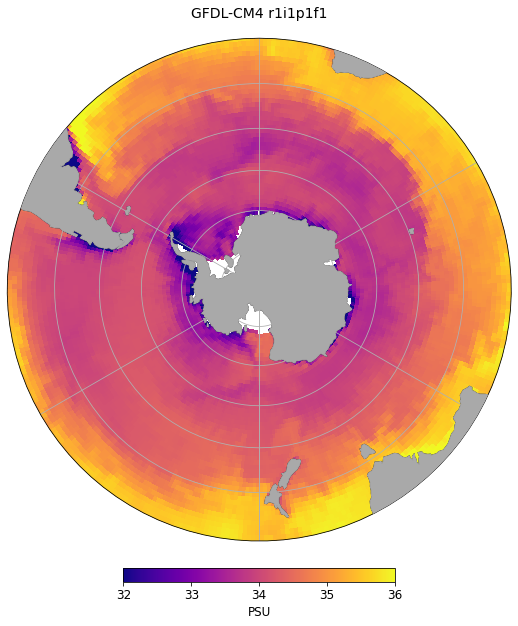

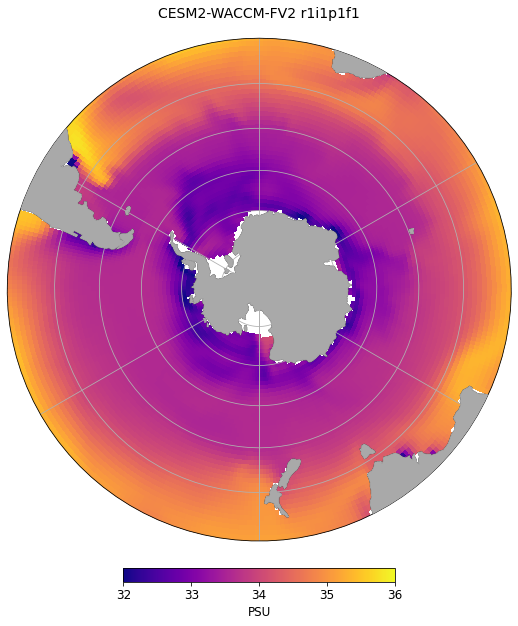

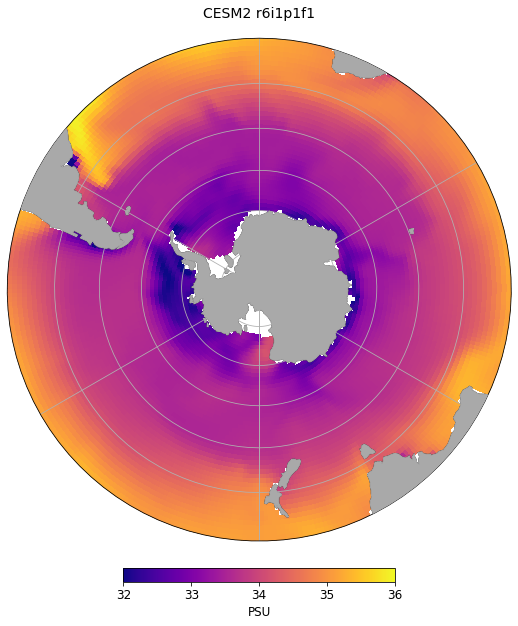

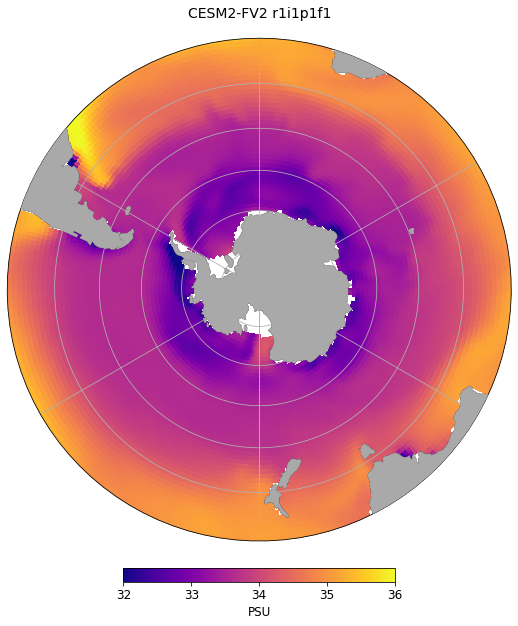

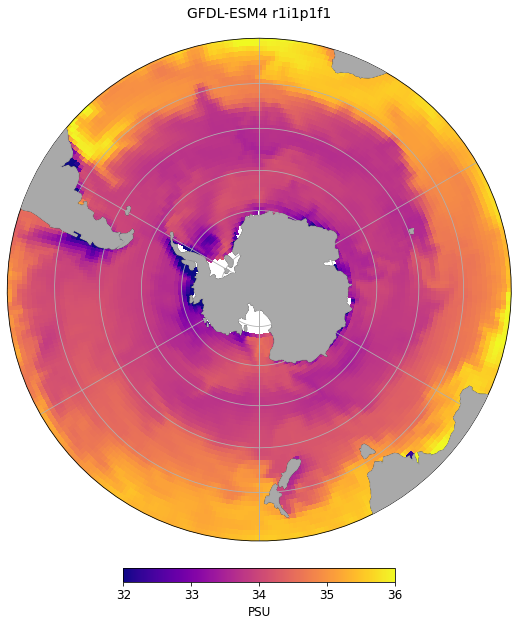

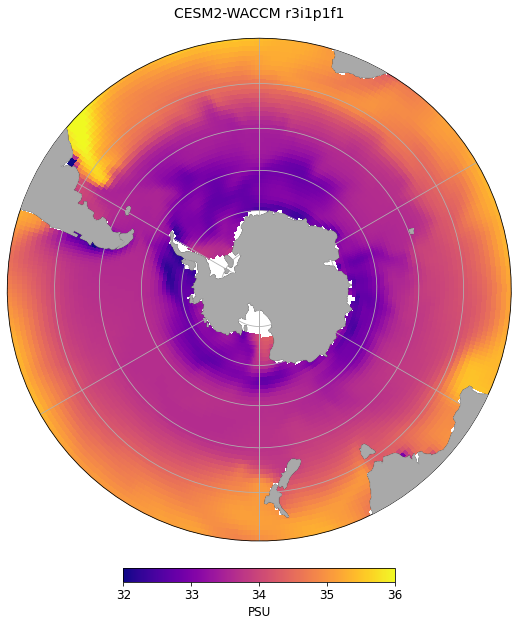

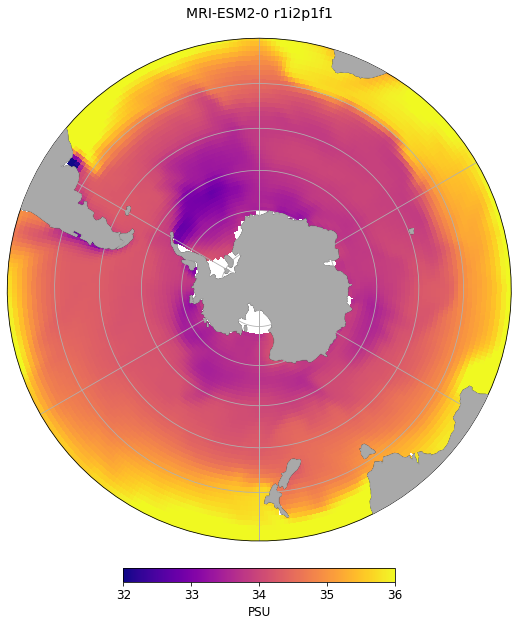

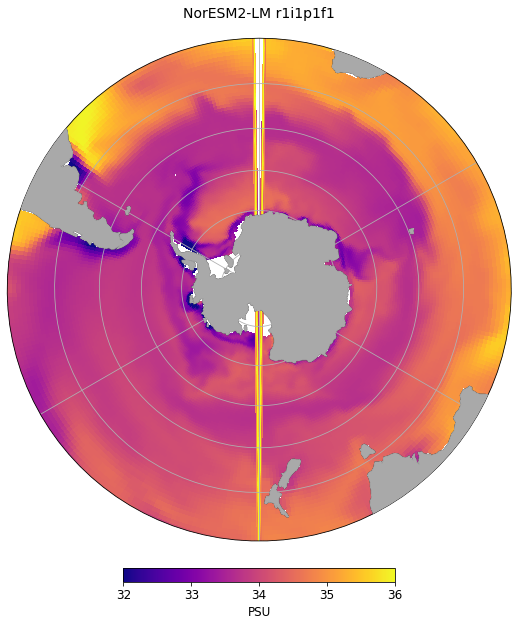

In [24]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_so in dd_so.items():
    #ax = axarr_DIC.flat[ax_idx]
#     if 'member_id' in ds_DIC.dims:
#         ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_so.so.isel(lev = 0, time = 1)
#     print(surf)
    lat = ds_so.lat.transpose('y','x')
#     print(lat)
    lon = ds_so.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='plasma',cbar_label='PSU',title=ds_so.attrs['source_id']+ ' '+ds_so.attrs['variant_label'],plot_type='pcolormesh',clims=[32,36])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

In [33]:
dd_so['CESM2-WACCM-FV2.gr.historical.Omon'].so.lev


<xarray.DataArray 'lev' (lev: 33)>
array([   0.,   10.,   20.,   30.,   50.,   75.,  100.,  125.,  150.,  200.,
        250.,  300.,  400.,  500.,  600.,  700.,  800.,  900., 1000., 1100.,
       1200., 1300., 1400., 1500., 1750., 2000., 2500., 3000., 3500., 4000.,
       4500., 5000., 5500.])
Coordinates:
  * lev      (lev) float64 0.0 10.0 20.0 30.0 ... 4e+03 4.5e+03 5e+03 5.5e+03
Attributes:
    axis:           Z
    bounds:         lev_bnds
    long_name:      ocean model level
    positive:       down
    standard_name:  olevel
    units:          m

In [28]:
dd_so['CESM2-WACCM-FV2.gr.historical.Omon'].time

<xarray.DataArray 'time' (time: 1980)>
array([cftime.DatetimeNoLeap(1850, 1, 15, 13, 0, 0, 0),
       cftime.DatetimeNoLeap(1850, 2, 14, 0, 0, 0, 0),
       cftime.DatetimeNoLeap(1850, 3, 15, 12, 0, 0, 0), ...,
       cftime.DatetimeNoLeap(2014, 10, 15, 12, 0, 0, 0),
       cftime.DatetimeNoLeap(2014, 11, 15, 0, 0, 0, 0),
       cftime.DatetimeNoLeap(2014, 12, 15, 12, 0, 0, 0)], dtype=object)
Coordinates:
  * time     (time) object 1850-01-15 13:00:00 ... 2014-12-15 12:00:00
Attributes:
    axis:           T
    bounds:         time_bnds
    standard_name:  time
    title:          time
    type:           double

## Lev = 1; I think this is 10m

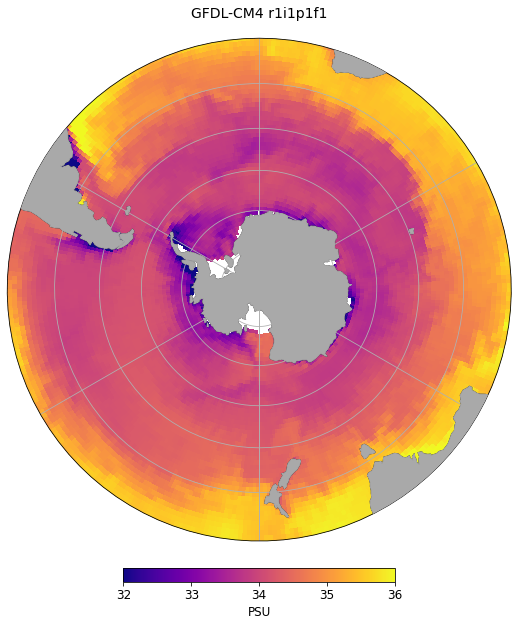

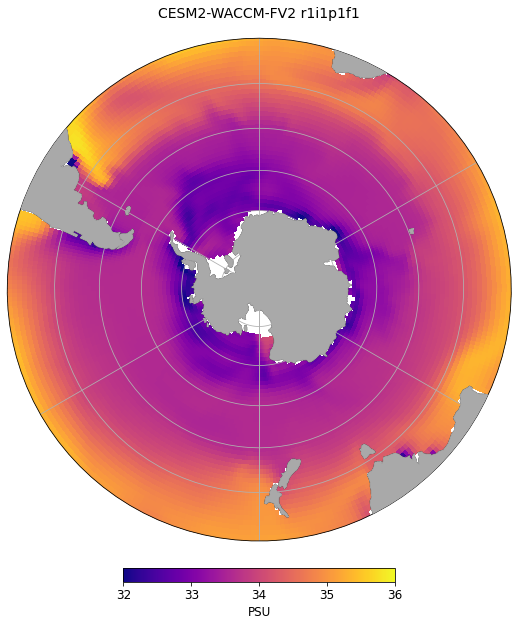

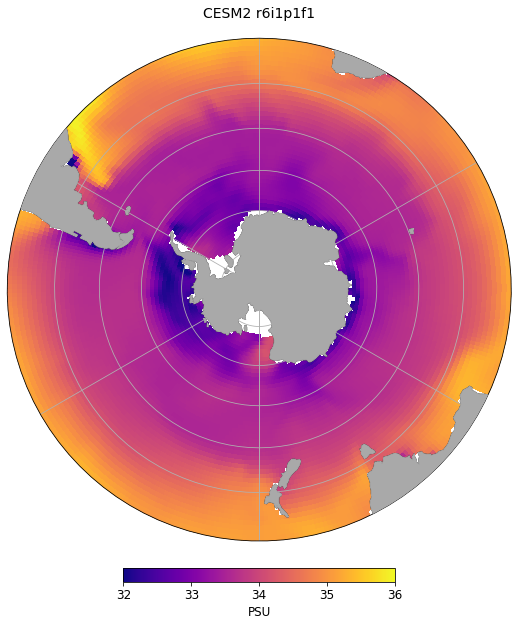

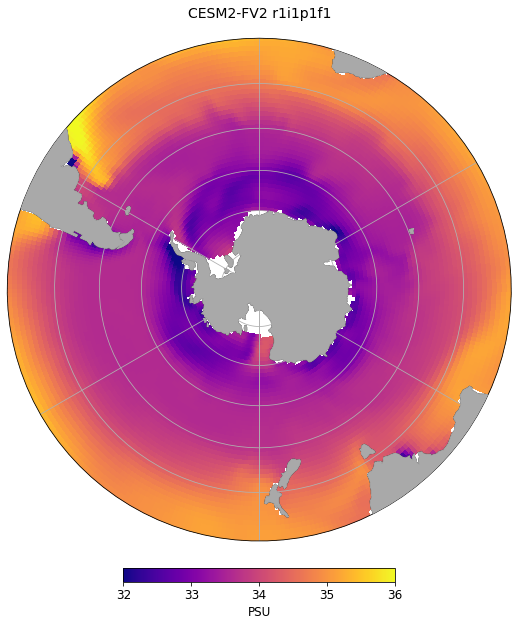

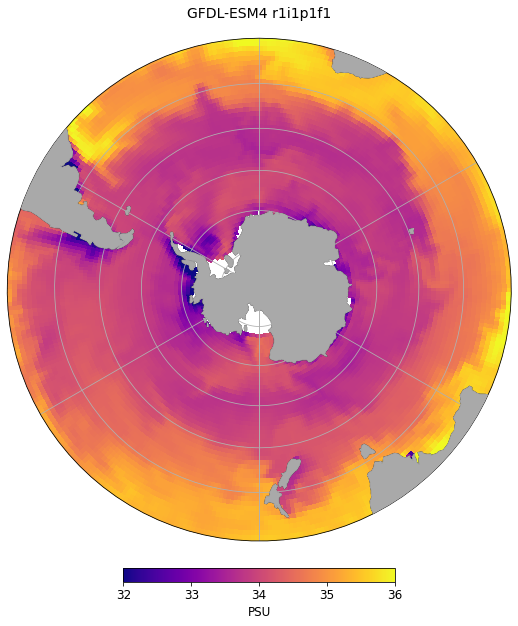

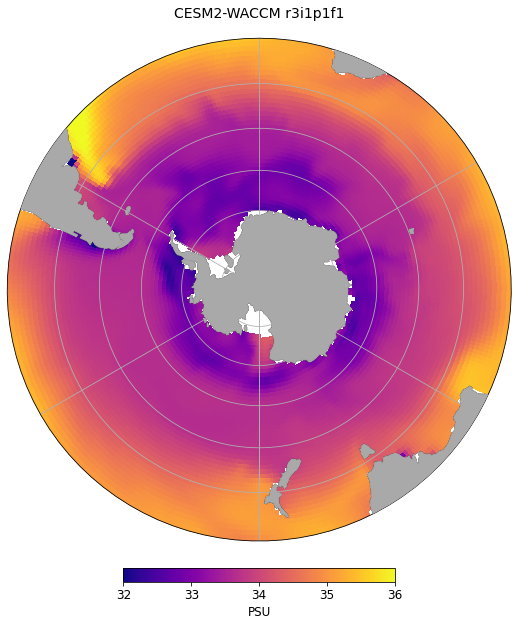

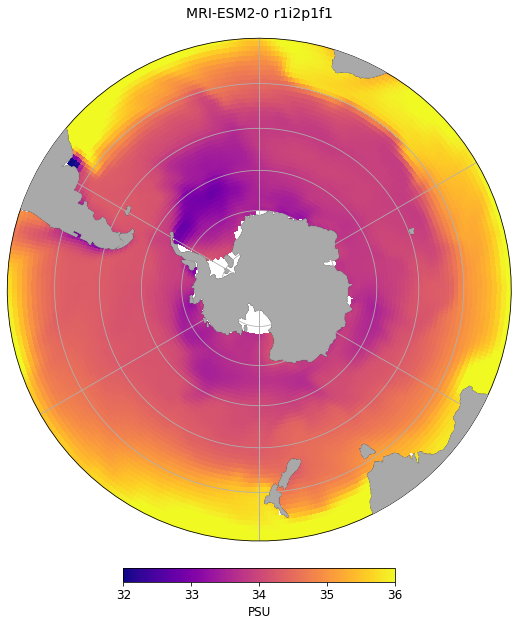

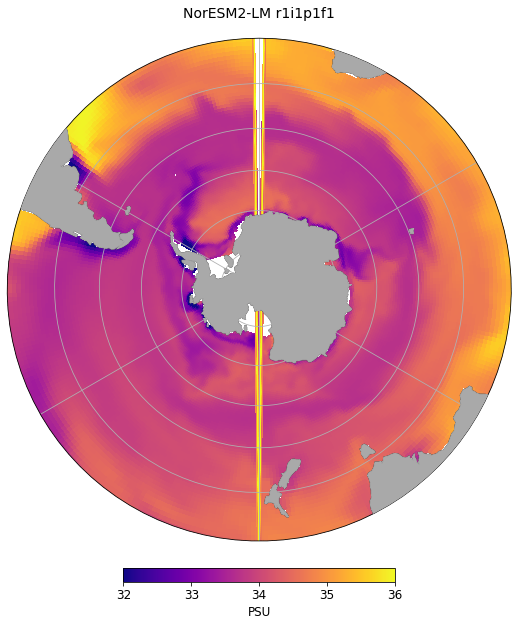

In [35]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_so in dd_so.items():
    #ax = axarr_DIC.flat[ax_idx]
#     if 'member_id' in ds_DIC.dims:
#         ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_so.so.isel(lev = 1, time = 1)
#     print(surf)
    lat = ds_so.lat.transpose('y','x')
#     print(lat)
    lon = ds_so.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='plasma',cbar_label='PSU',title=ds_so.attrs['source_id']+ ' '+ds_so.attrs['variant_label'],plot_type='pcolormesh',clims=[32,36])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

In [ ]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_DIC in dd_DIC.items():
    #ax = axarr_DIC.flat[ax_idx]
    if 'member_id' in ds_DIC.dims:
        ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_DIC.dissic.isel(lev = 1, time = 1)
#     print(surf)
    lat = ds_DIC.lat.transpose('y','x')
#     print(lat)
    lon = ds_DIC.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='viridis',cbar_label='DIC mol/m3',title=ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'],plot_type='pcolormesh',clims=[1.85,2.25])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
#     ax.set_title(ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'])
#     ax.set_xlabel('Latitude')
#     ax.set_ylabel('Depth (m)')
#     ax.set_ylim([6000, 0])
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

## Lev = 6; I think this is 100m

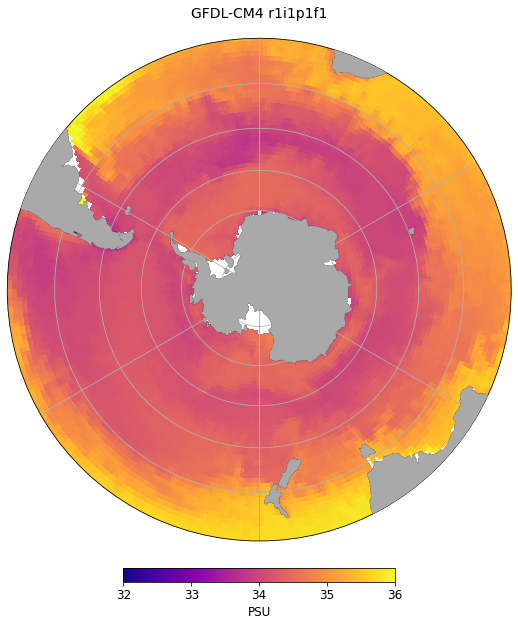

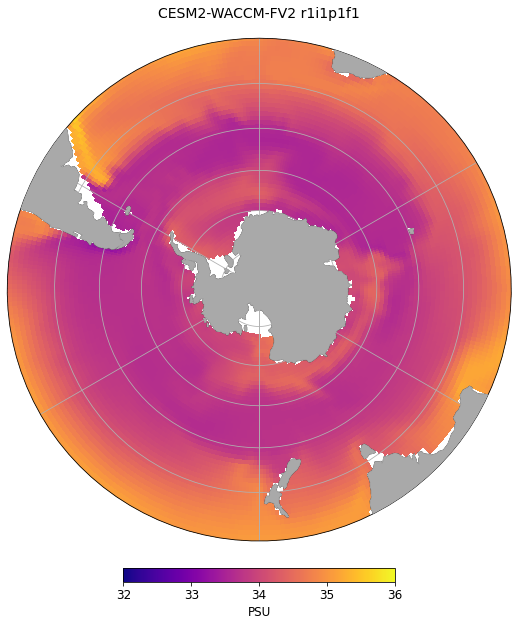

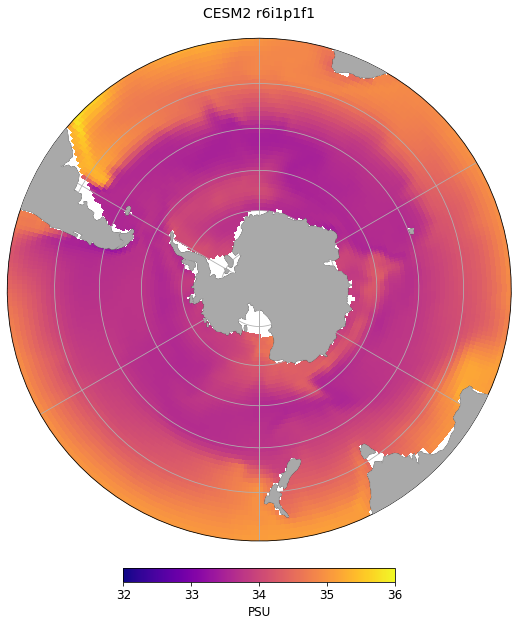

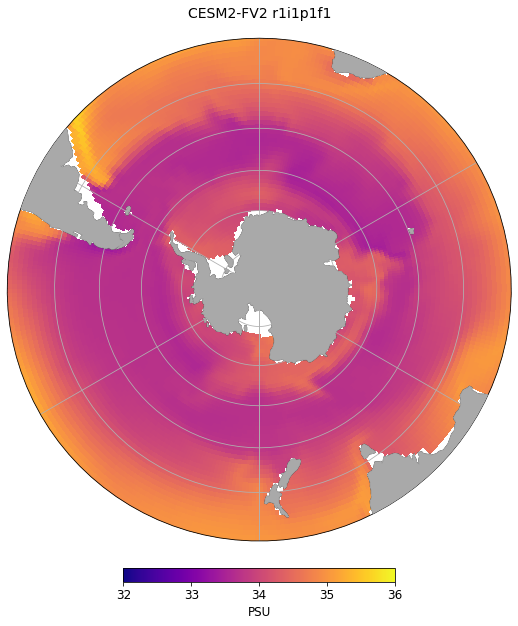

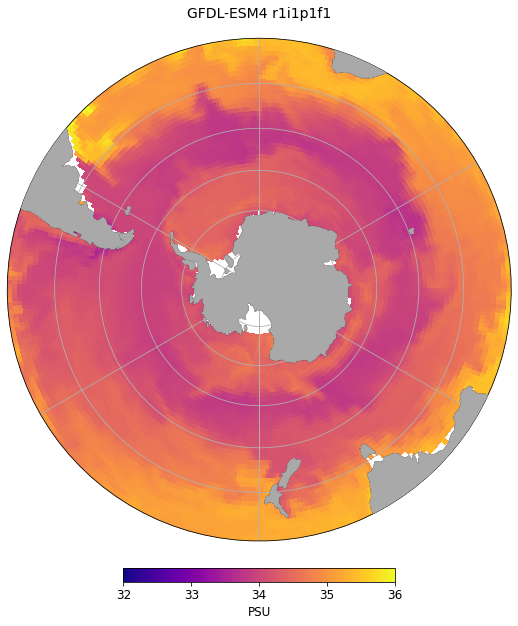

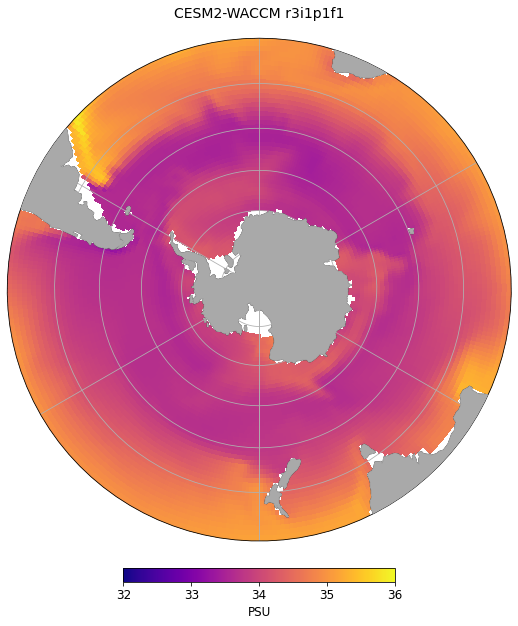

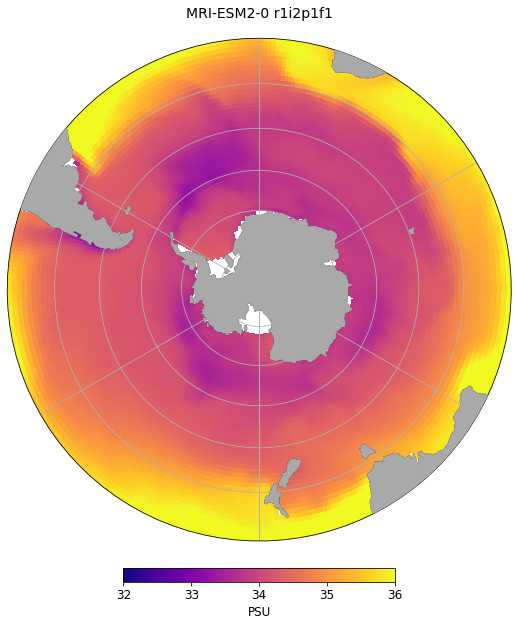

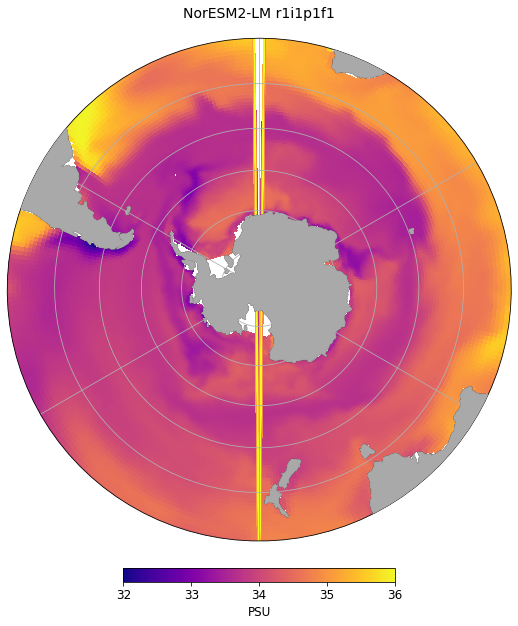

In [36]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_so in dd_so.items():
    #ax = axarr_DIC.flat[ax_idx]
#     if 'member_id' in ds_DIC.dims:
#         ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_so.so.isel(lev = 6, time = 1)
#     print(surf)
    lat = ds_so.lat.transpose('y','x')
#     print(lat)
    lon = ds_so.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='plasma',cbar_label='PSU',title=ds_so.attrs['source_id']+ ' '+ds_so.attrs['variant_label'],plot_type='pcolormesh',clims=[32,36])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

In [ ]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_DIC in dd_DIC.items():
    #ax = axarr_DIC.flat[ax_idx]
    if 'member_id' in ds_DIC.dims:
        ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_DIC.dissic.isel(lev = 6, time = 1)
#     print(surf)
    lat = ds_DIC.lat.transpose('y','x')
#     print(lat)
    lon = ds_DIC.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='viridis',cbar_label='DIC mol/m3',title=ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'],plot_type='pcolormesh',clims=[1.85,2.25])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
#     ax.set_title(ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'])
#     ax.set_xlabel('Latitude')
#     ax.set_ylabel('Depth (m)')
#     ax.set_ylim([6000, 0])
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

## Lev = 9; 200m

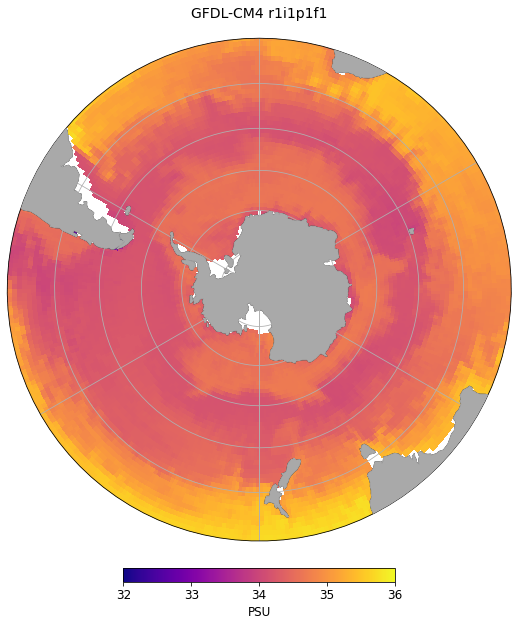

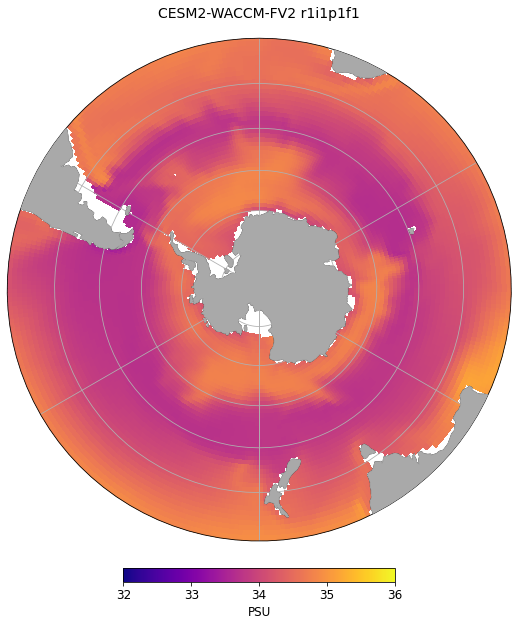

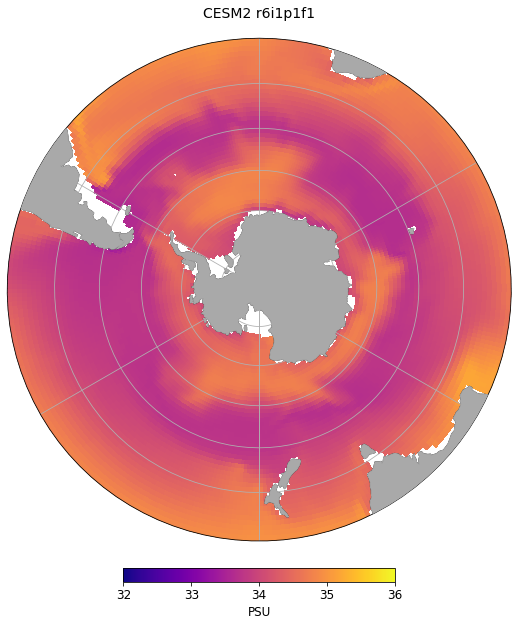

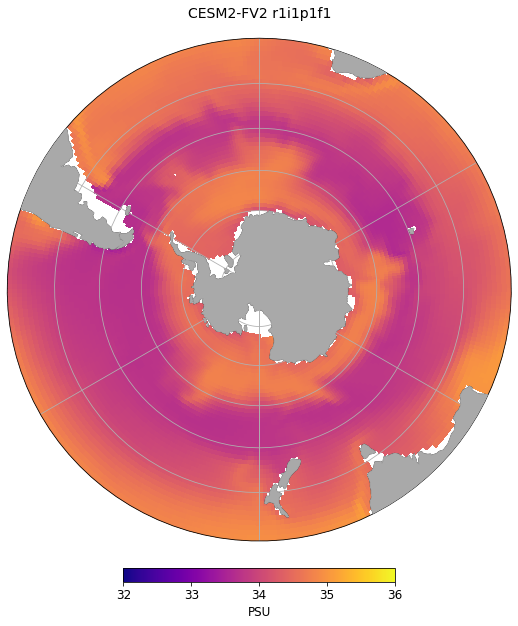

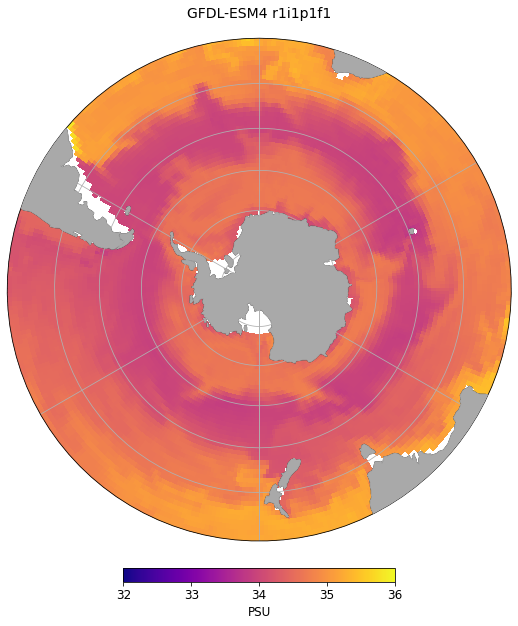

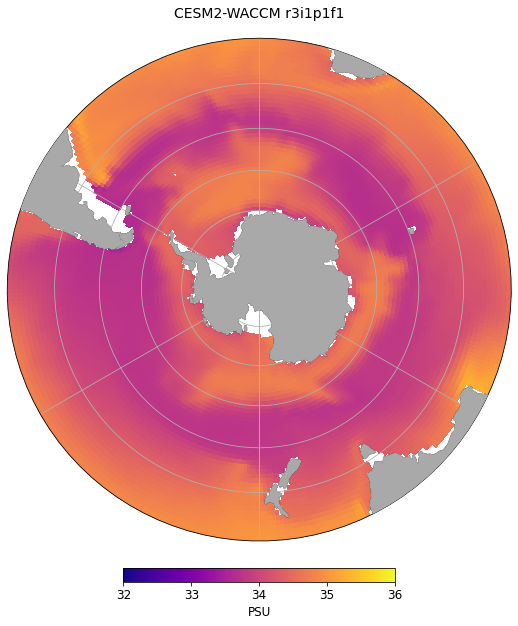

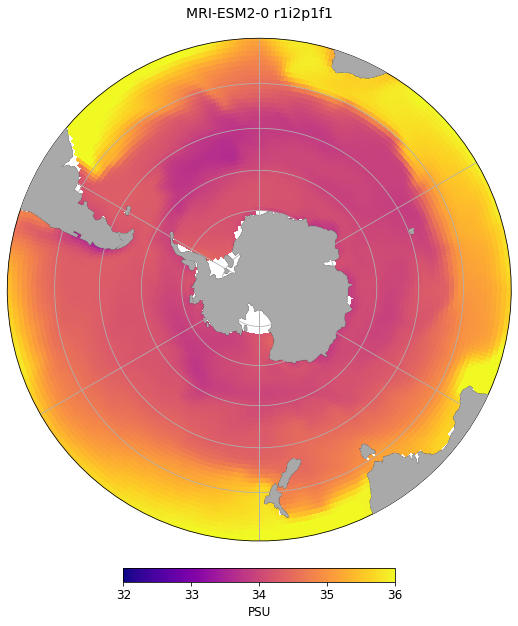

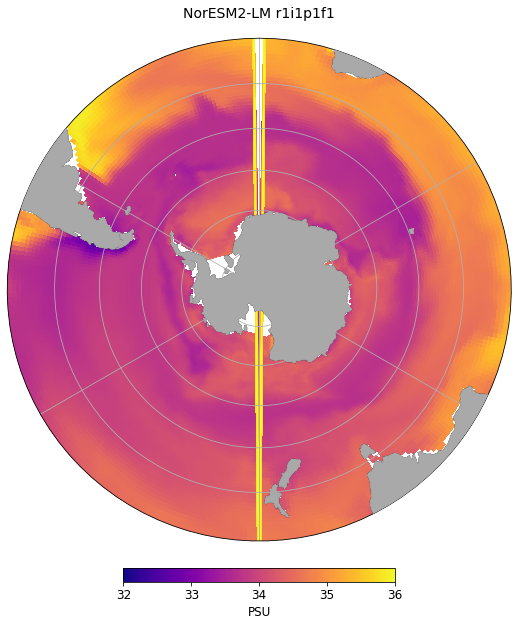

In [37]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_so in dd_so.items():
    #ax = axarr_DIC.flat[ax_idx]
#     if 'member_id' in ds_DIC.dims:
#         ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_so.so.isel(lev = 9, time = 1)
#     print(surf)
    lat = ds_so.lat.transpose('y','x')
#     print(lat)
    lon = ds_so.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='plasma',cbar_label='PSU',title=ds_so.attrs['source_id']+ ' '+ds_so.attrs['variant_label'],plot_type='pcolormesh',clims=[32,36])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

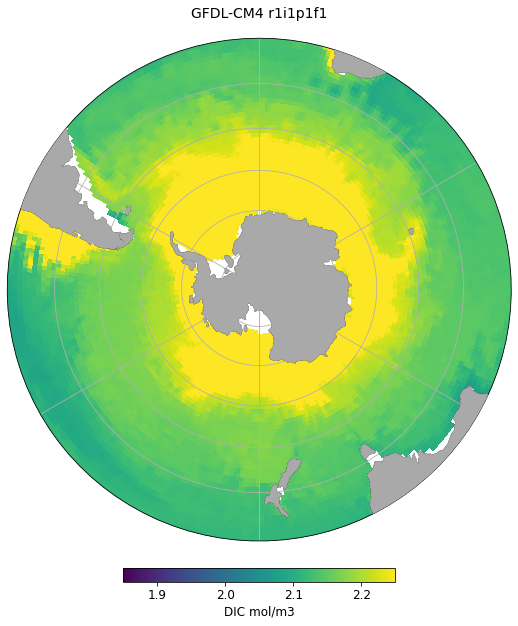

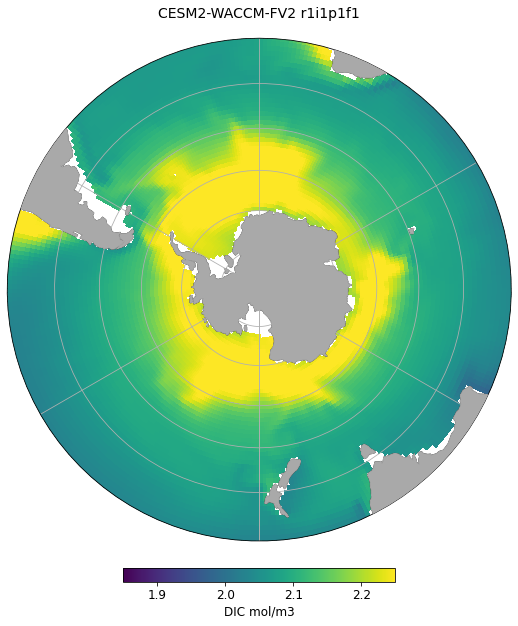

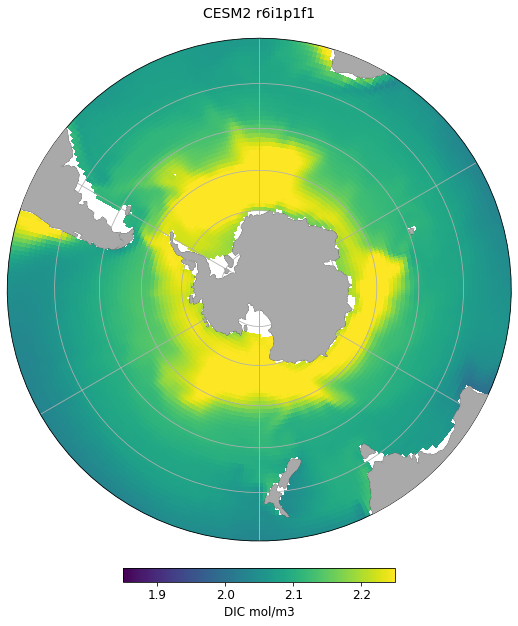

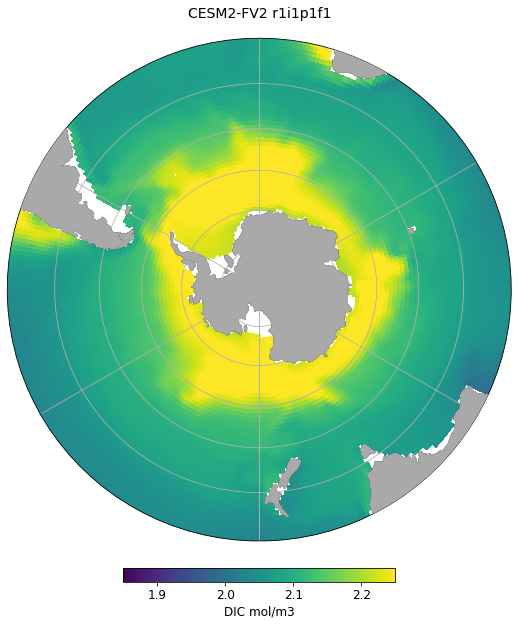

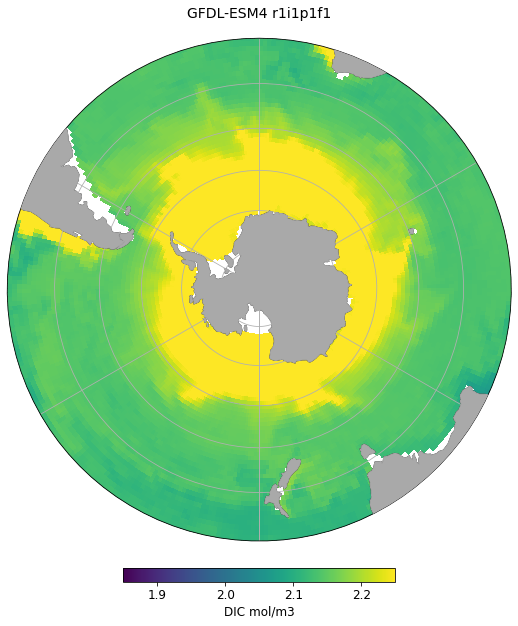

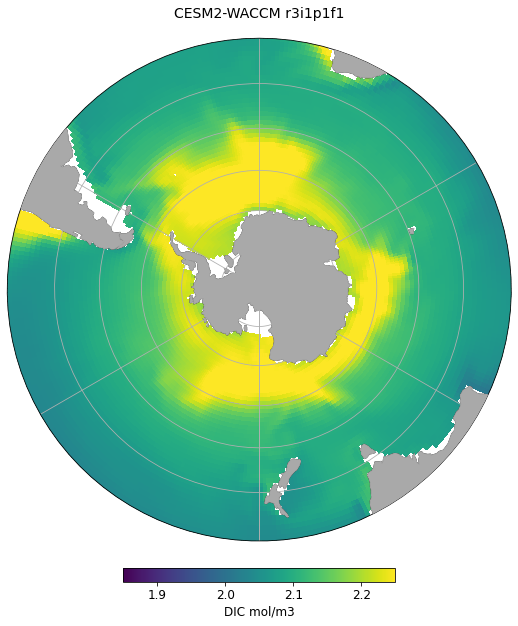

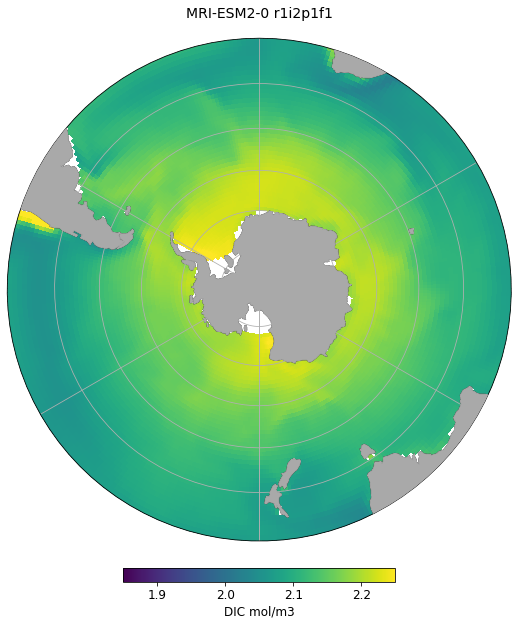

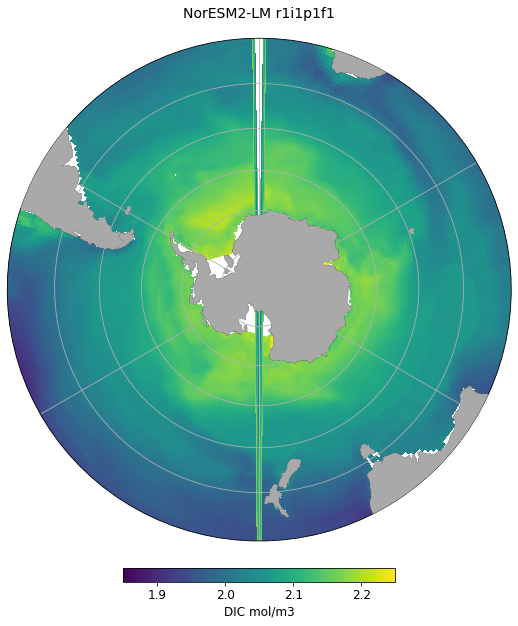

In [42]:
plt.rc('font', size = 12)
plt.rc('axes', titlesize= 10)    
plt.rc('axes', labelsize= 10)
plt.rc('figure', titlesize=14)

#loop over each key, value pair of the dictionary
ax_idx = 0 # index for your axes array
for name, ds_DIC in dd_DIC.items():
    #ax = axarr_DIC.flat[ax_idx]
    if 'member_id' in ds_DIC.dims:
        ds_DIC = ds_DIC.isel(member_id=0)
    surf = ds_DIC.dissic.isel(lev = 9, time = 1)
#     print(surf)
    lat = ds_DIC.lat.transpose('y','x')
#     print(lat)
    lon = ds_DIC.lon.transpose('y','x')
    draw_SOcustom(lon.data,lat.values,surf,cmap='viridis',cbar_label='DIC mol/m3',title=ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'],plot_type='pcolormesh',clims=[1.85,2.25])
    #DIC_section = ds_DIC.dissic.where(np.logical_and(ds_DIC.lon<=200, ds_DIC.lon>=180), drop=True).isel(time = 0).mean('x', keep_attrs=True)
    #im = DIC_section.plot(x='y', y='lev', yincrease=False, ax = ax, cbar_kwargs={'label':'DIC mol/m3'})
#     ax.set_title(ds_DIC.attrs['source_id']+ ' '+ds_DIC.attrs['variant_label'])
#     ax.set_xlabel('Latitude')
#     ax.set_ylabel('Depth (m)')
#     ax.set_ylim([6000, 0])
    ax_idx += 1 # this is a nifty python trick to increment a variable by one

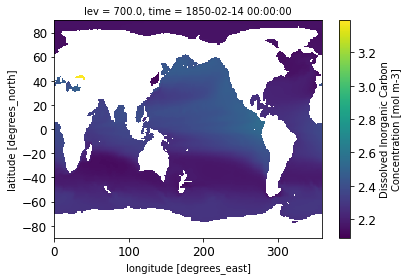

In [40]:
dd_DIC['CESM2-WACCM-FV2.gr.historical.Omon'].dissic.isel(lev=15, time=1).plot()